In [18]:
# run me!
!pip install -r requirements.txt

In [289]:
import CarbonaraDataTools as CDT
import writhe as wr
import plotly.graph_objects as go
import numpy as np
import os
from glob import glob
import re
from plotly.subplots import make_subplots

 # Example of taking original PDB + SAXS -> `Fitting/` (ready to run)

In [97]:
pdb_file = 'human_SMARCAL1.pdb'
SAXS_file = 'smrclcnc_a2.dat'

# This removes then writes the `Fitting/` directory
working_path = CDT.setup_working_directory()

# Matteo's BioBox to manipulate PDB files
M = CDT.pdb_2_biobox(pdb_file)

# Extract coordinates + primary sequence
coords = CDT.extract_CA_coordinates(M)
sequence = CDT.extract_sequence(M)

# Using DSSP to predict secondary struct -> converted to simplistic: H, S, -
secondary = CDT.DSSP_structure_extractor(pdb_file)

# Writes all the coords, fingerprint, mixture & SAXS in Carbonara's expected input / file struct
CDT.write_fingerprint_file(1, sequence, secondary, working_path)
CDT.write_coordinates_file(coords, working_path)
CDT.write_mixture_file(working_path)
CDT.write_saxs(SAXS_file, working_path)

Removing existing working directory
Complete


# 3D view structure

In [19]:
x_lst, y_lst, z_lst, color_lst = CDT.smooth_me(coords, secondary, oversample=5)
structure_fig = CDT.line_plotly(x_lst, y_lst, z_lst, color_lst, outline=True)
structure_fig.update_layout(height=600)
structure_fig.show()

In [41]:
len(color_lst)

2486

# Writhe stuff

In [37]:
# writhe with every n(=4) alpha carbon
writhe_fp = wr.writhe_fingerprint(segments=coords[::4])

fig = go.Figure()

fig.add_trace(go.Heatmap(z=writhe_fp, colorscale='RdBu_r',
                         colorbar = dict(title='Writhe')))

fig.update_layout(height=600, width=600, template='plotly_white')

In [12]:
# finding the start / end index of each secondary section
structure_change = np.diff(np.unique(secondary, return_inverse=True)[1])
secondary_groups = CDT.get_section_groupings(secondary, structure_change)

secondary_conds = np.diff( secondary_groups )
secondary_conds = np.insert(secondary_conds, 0, 1)
secondary_conds[-1] = 1

ss_coords = coords[secondary_conds == 1, :]
 
# alpha carbons at each secondary boundary
writhe_fp_ss = wr.writhe_fingerprint(segments=ss_coords)

In [32]:
fig = go.Figure()

fig.add_trace(go.Heatmap(z=writhe_fp_ss, colorscale='RdBu_r',
                         colorbar = dict(title='Writhe')))

fig.update_layout(height=600, width=600, template='plotly_white')

# Issue with the PB2 PDB - DSSP doesn't like it :(

In [7]:
# pdb_file = 'PB2.pdb'
# SAXS_file = 'PB2Saxs.dat'

# working_path = CDT.setup_working_directory()

# M = CDT.pdb_2_biobox(pdb_file)

# Extract coordinates + primary sequence
# coords = CDT.extract_CA_coordinates(M)

# sequence = CDT.extract_sequence(M)

# something funky about the PB2.pdb -> DSSP finder isn't working (failed with BioPython and Matteo's BioBox)
# secondary = CDT.DSSP_structure_extractor(pdb_file)



# CDT.write_fingerprint_file(1, sequence, secondary, working_path)
# CDT.write_coordinates_file(coords, working_path)
# CDT.write_mixture_file(working_path)

# CDT.write_saxs(SAXS_file, working_path)

# Need latest build of Carbonara to run Auto varying structure finder!

In [107]:
# lst_allowed = []
# for i in range(10):

allowed_linker, linker_indices = CDT.find_non_varying_linkers()
# lst_allowed.append(allowed_linker)

100%|███████████████████████████████████████████| 43/43 [00:07<00:00,  5.46it/s]


In [108]:
allowed_linker

array([14, 16, 18, 20, 59, 61, 86, 88, 90])

In [109]:
lst_allowed

[array([14, 16, 18, 20, 59, 61, 86, 88, 90]),
 array([14, 16, 18, 20, 59, 61, 86, 88, 90]),
 array([14, 16, 18, 20, 59, 61, 86, 88, 90]),
 array([14, 16, 18, 20, 59, 61, 86, 88, 90]),
 array([14, 16, 18, 20, 59, 61, 86, 88, 90]),
 array([14, 16, 18, 20, 59, 61, 86, 88, 90]),
 array([14, 16, 18, 20, 59, 61, 86, 88, 90]),
 array([14, 16, 18, 20, 59, 61, 86, 88, 90]),
 array([14, 16, 18, 20, 59, 61, 86, 88, 90]),
 array([14, 16, 18, 20, 59, 61, 86, 88, 90])]

In [111]:
linker_indices

array([ 2,  4,  6,  8, 11, 14, 16, 18, 20, 22, 24, 26, 28, 31, 33, 36, 39,
       41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 64, 66, 68, 70, 72, 74,
       76, 78, 80, 82, 84, 86, 88, 90])

In [2]:
from scipy import interpolate


In [3]:
def smooth_me_varying(coords, ss, vary_sections, oversample=5):

    structure_change = np.diff(np.unique(ss, return_inverse=True)[1])
    sections = CDT.section_finder(ss)
    structural_groups = CDT.get_section_groupings(ss, structure_change)

    color_lst = []

    x_lst = [] 
    y_lst = [] 
    z_lst = [] 

    for i, sec in enumerate(sections):


        tmp = coords[np.where(structural_groups==i)]

        if tmp.shape[0]>3:

            if sec == 'H':
                tck, u = interpolate.splprep([tmp[:,0], tmp[:,1], tmp[:,2]], s=.25)

            else: 
                tck, u = interpolate.splprep([tmp[:,0], tmp[:,1], tmp[:,2]], s=100)
            res_size = oversample*tmp.shape[0]
            u_fine = np.linspace(0,1,res_size)
            new_points = interpolate.splev(u_fine, tck)

            x_lst = x_lst + list(new_points[0])
            y_lst = y_lst + list(new_points[1])
            z_lst = z_lst + list(new_points[2])

            if i in vary_sections:
                color_lst = color_lst + ['red'] * res_size
            else:
                color_lst = color_lst + ['grey'] * res_size
        else:

            x_lst = x_lst + list(tmp[:,0])
            y_lst = y_lst + list(tmp[:,1])
            z_lst = z_lst + list(tmp[:,2])

            if i in vary_sections:
                color_lst = color_lst + ['red'] * tmp.shape[0]
            else:
                color_lst = color_lst + ['grey'] * tmp.shape[0]


    return x_lst, y_lst, z_lst, color_lst

In [4]:
# CDT.sheet_pipe('Fitting/coordinates1.dat', 'Fitting/fingerPrint1.dat')

In [5]:
# allowed_linker = np.asarray([13, 15, 17, 19, 21, 23, 25, 27, 29, 32, 35, 43, 45, 51, 53, 55, 57, 59, 61, 73, 75, 77, 79, 81, 83])+1

# # allowed_linker = np.asarray([ 2,  4,  6,  8, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 32, 35, 37,
#        39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67, 69, 71,
#        73, 75, 77, 79, 81, 83]) 

array([ 2,  6, 11, 16, 20, 24, 28, 33, 39, 43, 47, 51, 55, 59, 64, 68, 72,
       76, 80, 84, 88])

In [126]:
x_lst, y_lst, z_lst, color_lst = smooth_me_varying(coords, secondary, allowed_linker, oversample=5)
structure_fig = CDT.line_plotly(x_lst, y_lst, z_lst, color_lst, outline=True)
structure_fig.update_layout(height=600)
structure_fig.show()

In [138]:
molecule_files = glob('newFitData/*')
molecule_directory = []
molecule_name_lst = [] 
for d in molecule_files:
    if os.path.isdir(d):
        molecule_directory.append(d)
        molecule_name_lst.append(d.split('/')[-1])
        
molecule_dict = dict(zip(molecule_name_lst, molecule_directory))


In [15]:

glob('/home/josh/Downloads/Run_stuff/newFitData/Fitting/*')

[]

In [9]:
glob('newFitData/Fitting/*_SAXS.dat')

[]

In [10]:
# !streamlit run Carbonara_App.py

In [11]:
# identify all log files 
logs = glob('newFitData/Chris_stuff/withTagTest1/fitLog*')

In [12]:
run_folders = []
for f in glob('newFitData/Chris_stuff/*'):

    if os.path.isdir(f):
        run_folders.append(f)

In [13]:
log_files = []
for folder in run_folders:
    
    log_files = log_files + glob(folder+ '/fitLog*')

In [306]:
best_fit_files = []
max_q_lst = []
best_fit_scatter_files = []

for f in log_files:
#     print(f)
    log_df = CDT.log2df(f)[1:-1]
    
    
    tmp = log_df.loc[log_df.groupby('max_fitting_k')['total_penalty'].idxmin()]
    
    best_fits = list( tmp['file_name'].values )
    max_qs = list( tmp['max_fitting_k'].values )
    
    for idx, bf in enumerate(best_fits):
        
    
        name = log_df['file_name'].values[-1].split('/')[-1]
        nums = re.findall(r'\d+', name)

        path = '/'.join(log_df['file_name'].values[-1].split('/')[:-1]) 
        file = glob(path+'/mol'+nums[0]+'Substep_'+nums[1]+'*')
        
        if len(file) == 1:
            
            best_fit_scatter_files.append(best_fits[idx])
            
            best_fit_files.append(file[0])
    
            max_q_lst.append(max_qs[idx])
            
    
    

In [90]:
def fit_rms(ref_c,c):

    # move geometric center to the origin
    ref_trans = np.average(ref_c, axis=0)
    ref_c = ref_c - ref_trans
    c_trans = np.average(c, axis=0)
    c = c - c_trans

    # covariance matrix
    C = np.dot(c.T, ref_c)

    # Singular Value Decomposition
    (r1, s, r2) = np.linalg.svd(C)

    # compute sign (remove mirroring)

    if np.linalg.det(C) < 0:
        r2[2,:] *= -1.0
    U = np.dot(r1, r2)

    return (c_trans, U, ref_trans)


def find_rmsd(c1, c2, align_return=False):

    rmsd = 0.0
    c_trans, U, ref_trans = fit_rms(c1, c2)

    new_c2 = np.dot(c2 - c_trans, U) + ref_trans

    rmsd = np.sqrt( np.average( np.sum( ( c1 - new_c2 )**2, axis=1 ) ) )

    if align_return:
        return rmsd, new_c2
    
    else:
        return rmsd

#  def get_aligned_coord(self, atoms, name=None):

#     new_c2 = copy.deepcopy(atoms)

#     for atom in new_c2:

#         atom.x, atom.y, atom.z = np.dot(np.array([atom.x, atom.y, atom.z]) - self.c_trans, self.U) + self.ref_trans

#     return new_c2


def coord_tensor_pairwise_rmsd(coord_tensor):
    
    
#     
    size = coord_tensor.shape[-1]
    rmsd_arr = np.zeros((size, size))
    # size = 10
    for i in range(size):
        for j in range(i):
            rmsd = find_rmsd(coord_tensor[:,:,i], coord_tensor[:,:,j])
            rmsd_arr[i,j] = rmsd_arr[j,i] = rmsd
            
    return rmsd_arr

In [20]:
coord_tensor = CDT.extract_coords(best_fit_files[0])
for f in best_fit_files[1:]:
    
    tmp = CDT.extract_coords(f)
    
    coord_tensor = np.dstack((coord_tensor, tmp))

In [21]:
rmsd_arr = coord_tensor_pairwise_rmsd(coord_tensor)

In [22]:
import plotly.graph_objects as go

In [23]:
fig = go.Figure()
fig.add_trace(go.Heatmap(z=rmsd_arr, colorscale='RdBu_r'))
fig.update_layout(height=700, width=700)

In [24]:
from scipy.spatial.distance import squareform
import hdbscan

In [25]:
cond_dist_arr = squareform(rmsd_arr)
clusterer = hdbscan.HDBSCAN(min_cluster_size=8, gen_min_span_tree=True)
clusterer.fit(rmsd_arr)

HDBSCAN(gen_min_span_tree=True, min_cluster_size=8)

<AxesSubplot:ylabel='$\\lambda$ value'>

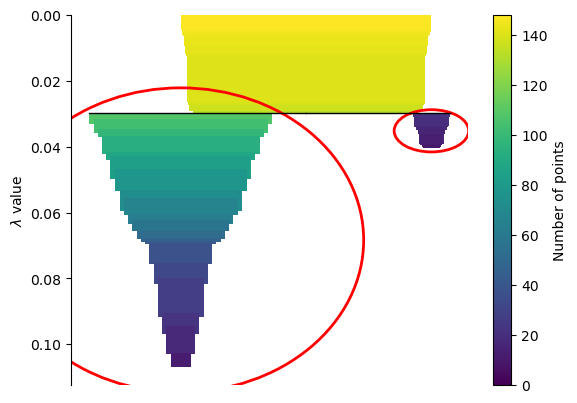

In [26]:
clusterer.condensed_tree_.plot(select_clusters=True)

In [27]:
clusterer.labels_

array([ 0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  1, -1,  0,  0,  0,  1,  1,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  0,  0,  1,
        0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  1,  0,  0, -1,
        0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,
        0,  0,  1,  0,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0, -1,  1,  1,
        0,  1,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0, -1, -1,
       -1,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  1,  0,  0,
       -1, -1, -1,  0,  0, -1, -1, -1,  1, -1,  1,  0,  1,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  0,  0])

In [92]:
def align_coords(tensor):
    
    new_coord_tensor = np.zeros_like(tensor)
    new_coord_tensor[:,:,0] = tensor[:,:,0]
    size = tensor.shape[-1]
    
    for i in range(1,size):
        rmsd, align_coords = find_rmsd(tensor[:,:,0], tensor[:,:,i], align_return=True)
        new_coord_tensor[:,:,i] = align_coords
        
        
    return new_coord_tensor

In [ ]:
labels = clusterer.labels_


test = np.dstack([coord_tensor[:,:,labels==0], coord_tensor[:,:,labels==1],
                  coord_tensor[:,:,labels==2], coord_tensor[:,:,labels==3],
                  coord_tensor[:,:,labels==-1]])



rmsd_arr_t = coord_tensor_pairwise_rmsd(test)

In [336]:
# np.asarray(bf_names)

In [331]:
bf_names_sort = np.concatenate([bf_names[labels==0], bf_names[labels==1]])


TypeError: only integer scalar arrays can be converted to a scalar index

In [356]:

cluster_cumsum = np.cumsum( np.asarray( [sum(labels==0), sum(labels==1), sum(labels==2),

                                         sum(labels==3), sum(labels==-1)] ) )

cluster_cumsum = np.insert(cluster_cumsum, 0, 0)

best_fit_files



bf_names = []
for bf in best_fit_files:
    bf_names.append(bf.split('/')[-2]+'/'+bf.split('/')[-1][:-4])

bf_names = np.asarray(bf_names)
bf_names_sort = np.concatenate([bf_names[labels==0], bf_names[labels==1], bf_names[labels==2], bf_names[labels==3], bf_names[labels==-1]])



    
hovertext = list()
for yi, yy in enumerate(bf_names_sort):
    hovertext.append(list())
    for xi, xx in enumerate(bf_names_sort):
        hovertext[-1].append('Structure X {}<br />Structure Y: {}'.format(xx, yy))
        
fig = go.Figure()
fig.add_trace(go.Heatmap(z=rmsd_arr_t, colorscale='RdBu_r', text=hovertext))

for v in cluster_cumsum:

    fig.add_hline(y=v-0.5, line_width=2, line_color="black")
    fig.add_vline(x=v-0.5, line_width=2, line_color="black")
    
    
    
fig.add_trace(go.Scatter(x=[10], y=[20]))

fig.update_layout(height=700, width=700)

fig.show()

In [362]:
np.where(bf_names_sort[1:]=='withTagTest1/mol19Substep_35_1')[0].item()

0

In [301]:
def overlay_coords(tensor):
    
    fig = go.Figure()

    for i in range(tensor.shape[-1]):
#         print(i)
        fig.add_trace(go.Scatter3d(x=tensor[:,0,i], y=tensor[:,1,i], z=tensor[:,2,i], opacity=0.4,
                               mode='lines',
                               line=dict( width=12,
#                                          color='red',
#                                          color=np.arange(tensor[:,0,i].shape[0]), 
                                         colorscale='greys')))
    
    
    av_coords = tensor.mean(axis=2)
    
#     fig.add_trace(go.Scatter3d(x=av_coords[:,0], y=av_coords[:,1], z=av_coords[:,2], opacity=0.7,
#                                mode='lines',
#                                line=dict( width=12,
#                                          color='black',
# #                                          color=np.arange(tensor[:,0,i].shape[0]), 
#                                          colorscale='greys')))
        
    fig['layout']['showlegend'] = False
    fig.update_layout( scene=dict(
        xaxis_title='',
        yaxis_title='',
        zaxis_title='',
        aspectratio = dict( x=1, y=1, z=1 ),
        aspectmode = 'manual',
        xaxis = dict(
            gridcolor="white",
            showbackground=False,
            zerolinecolor="white",
            nticks=0,
            showticklabels=False),
        yaxis = dict(
            gridcolor="white",
            showbackground=False,
            zerolinecolor="white",
            nticks=0,
            showticklabels=False),
        zaxis = dict(
            gridcolor="white",
            showbackground=False,
            zerolinecolor="white",
            nticks=0,
            showticklabels=False),),
        )

    # fig.update_layout(width=800, height=800)
    fig.update_layout(margin=dict(l=0, r=0, t=0, b=0))
    fig.update_traces(showlegend=False)
    return fig

In [302]:
probs = clusterer.probabilities_

In [303]:
probs > 0.8

array([ True,  True,  True, False, False, False, False, False, False,
       False,  True, False, False, False, False,  True,  True, False,
       False, False,  True,  True, False, False,  True,  True, False,
       False, False,  True,  True, False, False, False,  True,  True,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False,  True,
        True,  True,  True, False, False, False, False,  True,  True,
       False, False,  True,  True, False, False,  True, False, False,
       False, False,  True,  True, False,  True, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True,  True,  True, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False,  True,

In [304]:
new_tensor.mean(axis=2).shape

(546, 3)

In [305]:
conds = (probs > 0.8) & (labels==0)

tensor = coord_tensor[:,:,conds]
new_tensor = align_coords(tensor)
overlay_coords(new_tensor)

array([[ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  3.803607  ],
       [-0.55156616, -0.06488255,  6.5427565 ],
       ...,
       [22.529216  , 45.594305  , 41.88808   ],
       [23.794214  , 46.553305  , 45.41808   ],
       [26.27921413, 43.580305  , 45.84108   ]])

In [288]:
conds = (probs > 0.8) & (labels==1)

tensor = coord_tensor[:,:,conds]
new_tensor = align_coords(tensor)
overlay_coords(new_tensor)

In [155]:
def overlay_coords_confidence(tensor, probs, label_conds):
    
    fig = go.Figure()
    
    tensor = tensor[:,:,label_conds]
    opacity_lst=probs[label_conds]

    for i in range(tensor.shape[-1]):
#         print(i)
        fig.add_trace(go.Scatter3d(x=tensor[:,0,i], y=tensor[:,1,i], z=tensor[:,2,i], opacity=opacity_lst[i]**2 ,
                               mode='lines',
                               line=dict( width=12,
#                                          color=np.arange(tensor[:,0,i].shape[0]), 
                                         colorscale='greys')))

        
    fig['layout']['showlegend'] = False
    fig.update_layout( scene=dict(
        xaxis_title='',
        yaxis_title='',
        zaxis_title='',
        aspectratio = dict( x=1, y=1, z=1 ),
        aspectmode = 'manual',
        xaxis = dict(
            gridcolor="white",
            showbackground=False,
            zerolinecolor="white",
            nticks=0,
            showticklabels=False),
        yaxis = dict(
            gridcolor="white",
            showbackground=False,
            zerolinecolor="white",
            nticks=0,
            showticklabels=False),
        zaxis = dict(
            gridcolor="white",
            showbackground=False,
            zerolinecolor="white",
            nticks=0,
            showticklabels=False),),
        )

    # fig.update_layout(width=800, height=800)
    fig.update_layout(margin=dict(l=0, r=0, t=0, b=0))
    fig.update_traces(showlegend=False)
    return fig

In [162]:
new_tensor = align_coords(coord_tensor)


In [167]:
cluster_1_ol = overlay_coords_confidence(new_tensor, probs, labels==0)

In [168]:
cluster_2_ol = overlay_coords_confidence(new_tensor, probs, labels==1)

In [169]:
view = dp.Blocks("# Aligned cluster overlays", dp.Plot(cluster_1_ol), dp.Plot(cluster_2_ol))

In [170]:
dp.save_report(view, path="clustered.html")

[15:05:40] [DEBUG] <View version="1" fragment="false">
  <Text><![CDATA[# Aligned cluster overlays]]></Text>
  <Plot type="application/vnd.plotly.v1+json" responsive="true" scale="1.0" src="ref://902c4ab5a6"/>
  <Plot type="application/vnd.plotly.v1+json" responsive="true" scale="1.0" src="ref://db1527e636"/>
</View>



App saved to ./clustered.html

In [290]:
SAXS = np.genfromtxt(SAXS_file)
q = SAXS[:,0]
I = np.log(SAXS[:,1])


fitting_file_lst = np.asarray(best_fit_scatter_files) #[np.asarray(max_q_lst)==0.16]

# size = fitting_file_lst.shape[0]

# fit_q_arr = np.zeros((size, fit_q.shape[0]))
# fit_I_arr = np.zeros((size, fit_I.shape[0]))

fit_q_lst = []
fit_I_lst = []


for i, f in enumerate(fitting_file_lst):
    fitting = np.genfromtxt(f, skip_footer=1)
    fit_q_lst.append(list(fitting[:,0]))
    fit_I_lst.append((fitting[:,2]))
    
    

q_list = []
[q_list.extend(el) for el in fit_q_lst]

I_list = []
[I_list.extend(el) for el in fit_I_lst]



z = np.polyfit(q_list, I_list, 4)
p = np.poly1d(z)
xp = np.linspace(min(q_list), max(q_list), 100)


fig = make_subplots(rows=2, cols=1,row_heights=[0.7,0.3],vertical_spacing=0,shared_xaxes=True)


min_q = min(q_list)
max_q = max(q_list)

cond = (q >= min_q) & (q <= max_q) 
q_range = q[cond]
I_range = I[cond]

fig.add_trace( go.Scatter(x=q_range, y=I_range, mode='markers', line=dict(color="grey"), opacity=0.7, name='Data'), col=1, row=1)


# for qs, Is in zip(fit_q_lst, fit_I_lst):
#     fig.add_trace( go.Scatter(x=qs, y=Is, mode='markers', line=dict(color="red"), opacity=0.7, name='Data'))
fig.add_trace( go.Scatter(x=q_list, y=I_list, mode='markers', line=dict(color="red"), opacity=0.4, name='Data'), col=1, row=1)
fig.add_trace( go.Scatter(x=xp, y=p(xp), mode='lines', line=dict(color="red"), opacity=0.9, name='Data'), col=1, row=1)

residuals = p(q_range) - I_range


fig.add_trace(go.Scatter(x=q_range,y=residuals,mode='lines',name='Residual',showlegend=False,line=dict(color='red')),row=2,col=1)
fig.add_trace(go.Scatter(x=q_range,y=np.zeros_like(q_range),mode='lines',showlegend=False,line=dict(color='black',dash='dash',width=1)),row=2,col=1)

fig.update_layout(
    # title='Experiment vs Fit', 
                  # yaxis_type = "log", 
                template='simple_white',
                # width=1200, height=800, 
                font_size=18)

fig.update_yaxes(title_text="Intensity I(q)", row=1, col=1)
fig.update_yaxes(title_text="Residual", row=2, col=1)
fig.update_xaxes(title_text="q", row=2, col=1)

# max_res = max( np.abs(residuals).max(), .5)
max_res = np.abs(residuals).max()*1.3
fig.update_yaxes(range=[-max_res,max_res],row=2,col=1)
fig.update_layout(margin=dict(l=0, r=0, t=0, b=0))
fig.update_traces(showlegend=False)

fig.update_layout(height=900, width=1000, title_text='ff')
fig.show()



In [343]:
best_fit_files

['newFitData/human_SMARCAL1/withTagTest1/mol19Substep_35_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol19Substep_35_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol29Substep_22_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol10Substep_24_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol14Substep_28_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol7Substep_43_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol20Substep_53_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol5Substep_38_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol30Substep_30_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol30Substep_30_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol21Substep_25_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol26Substep_35_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol13Substep_41_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol13Substep_41_1.dat',
 'newFitData/human_SMARCAL1/withTagTest1/mol8Substep_47_1.dat',
 'newFitData/human_SMARCAL1/

In [350]:
saxs = np.genfromtxt('PB2Saxs.dat')
saxs[:,1] = saxs[:,1]*100000

In [351]:
np.savetxt('corrected_PB2Saxs.dat', saxs)